<a href="https://colab.research.google.com/github/xyluo25/OSM2GMNS/blob/master/streamlined_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Convert-map-file-to-GMNS-data-files" data-toc-modified-id="Convert-map-file-to-GMNS-data-files-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Convert map file to GMNS data files</a></span><ul class="toc-item"><li><span><a href="#Downoad-sample-data-from-Github" data-toc-modified-id="Downoad-sample-data-from-Github-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Downoad sample data from Github</a></span></li><li><span><a href="#How-to-install-osm2gmns" data-toc-modified-id="How-to-install-osm2gmns-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>How to install osm2gmns</a></span></li><li><span><a href="#How-to-update-osm2gmns" data-toc-modified-id="How-to-update-osm2gmns-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>How to update osm2gmns</a></span></li><li><span><a href="#Please-make-sure-you-have-v0.7.3-instaled." data-toc-modified-id="Please-make-sure-you-have-v0.7.3-instaled.-1.4"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>Please make sure you have v0.7.3 instaled.</a></span></li><li><span><a href="#Read-network-from-data-we-just-downloaded" data-toc-modified-id="Read-network-from-data-we-just-downloaded-1.5"><span class="toc-item-num">1.5&nbsp;&nbsp;</span>Read network from data we just downloaded</a></span></li><li><span><a href="#Show-GMNS-files-on-the-map" data-toc-modified-id="Show-GMNS-files-on-the-map-1.6"><span class="toc-item-num">1.6&nbsp;&nbsp;</span>Show GMNS files on the map</a></span></li></ul></li><li><span><a href="#Generate-zone-grids-and-zonal-geometry-information" data-toc-modified-id="Generate-zone-grids-and-zonal-geometry-information-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Generate zone grids and zonal geometry information</a></span></li><li><span><a href="#Trip-generation" data-toc-modified-id="Trip-generation-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Trip generation</a></span></li><li><span><a href="#Trip-distribution-and-create-zonal-demand" data-toc-modified-id="Trip-distribution-and-create-zonal-demand-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Trip distribution and create zonal demand</a></span></li><li><span><a href="#plot4gmns-Tutorial" data-toc-modified-id="plot4gmns-Tutorial-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>plot4gmns Tutorial</a></span><ul class="toc-item"><li><span><a href="#Install-Package" data-toc-modified-id="Install-Package-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Install Package</a></span></li><li><span><a href="#import-the-package" data-toc-modified-id="import-the-package-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>import the package</a></span></li><li><span><a href="#prepare-your-absolute-directory-for-the-input" data-toc-modified-id="prepare-your-absolute-directory-for-the-input-5.3"><span class="toc-item-num">5.3&nbsp;&nbsp;</span>prepare your absolute directory for the input</a></span></li></ul></li></ul></div>

## Convert map file to GMNS data files 

the first step of intergated modeling is to covert OpenStreetMap file into GMNS data specification in csv
- Python tool: **OSM2GMNS**
- tool function: *getNetFromFile()*, *outputNetToCSV*
- inputs: 'map.osm'
- outputs: 'node.csv', 'link.csv' , 'poi.csv'(optional)


### Downoad sample data from Github
  1. create a class to download data from Github directly

In [ ]:
# -*- coding:utf-8 -*-
##############################################################
# Created Date: Monday, February 20th 2023
# Contact Info: luoxiangyong01@gmail.com
# Author/Copyright: Mr. Xiangyong Luo
##############################################################

import re
import os
import urllib.request
import json
import sys

# Dont's worry about the class defined here, we use this class directly.

# a class to download fold/file from Github directly.
class GitHubFileDownloader:
    def __init__(self, repo_url, flatten_files=True, output_dir="./"):
        self.repo_url = repo_url
        self.flatten = flatten_files
        self.output_dir = output_dir

    def create_url(self, url):  # sourcery skip: use-getitem-for-re-match-groups
        """
        From the given url, produce a URL that is compatible with Github's REST API. Can handle blob or tree paths.
        """
        repo_only_url = re.compile(r"https:\/\/github\.com\/[a-z\d](?:[a-z\d]|-(?=[a-z\d])){0,38}\/[a-zA-Z0-9]+$")
        re_branch = re.compile("/(tree|blob)/(.+?)/")

        # Check if the given url is a url to a GitHub repo. If it is, tell the
        # user to use 'git clone' to download it
        if re.match(repo_only_url, url):
            print("✘ The given url is a complete repository. Use 'git clone' to download the repository")
            sys.exit()

        # extract the branch name from the given url (e.g master)
        branch = re_branch.search(url)
        download_dirs = url[branch.end():]
        api_url = (url[:branch.start()].replace("github.com", "api.github.com/repos", 1) + "/contents/" + download_dirs + "?ref=" + branch.group(2))
        return api_url, download_dirs

    def download(self):
        """ Downloads the files and directories in repo_url. If flatten is specified, the contents of any and all
        sub-directories will be pulled upwards into the root folder. """

        # generate the url which returns the JSON data
        api_url, download_dirs = self.create_url(self.repo_url)

        # To handle file names.
        if self.flatten:
            dir_out = self.output_dir

        elif len(download_dirs.split(".")) == 0:
            dir_out = os.path.join(slef.output_dir, download_dirs)
        else:
            dir_out = os.path.join(self.output_dir, "/".join(download_dirs.split("/")[:-1]))
        try:
            opener = urllib.request.build_opener()
            opener.addheaders = [('User-agent', 'Mozilla/5.0')]
            urllib.request.install_opener(opener)
            response = urllib.request.urlretrieve(api_url)
        except KeyboardInterrupt:
            # when CTRL+C is pressed during the execution of this script,
            # bring the cursor to the beginning, erase the current line, and dont make a new line
            print("✘ Got interrupted")
            sys.exit()

        if not self.flatten:
            # make a directory with the name which is taken from
            # the actual repo
            os.makedirs(dir_out, exist_ok=True)

        # total files count
        total_files = 0

        with open(response[0], "r") as f:
            data = json.load(f)
            # getting the total number of files so that we
            # can use it for the output information later
            total_files += len(data)

            # If the data is a file, download it as one.
            if isinstance(data, dict) and data["type"] == "file":
                try:
                    # download the file
                    opener = urllib.request.build_opener()
                    opener.addheaders = [('User-agent', 'Mozilla/5.0')]
                    urllib.request.install_opener(opener)
                    urllib.request.urlretrieve(data["download_url"], os.path.join(dir_out, data["name"]))
                    # bring the cursor to the beginning, erase the current line, and dont make a new line
                    print("Downloaded: " + "{}".format(data["name"]))

                    return total_files
                except KeyboardInterrupt:
                    # when CTRL+C is pressed during the execution of this script,
                    # bring the cursor to the beginning, erase the current line, and dont make a new line
                    print("✘ Got interrupted")
                    sys.exit()

            for file in data:
                file_url = file["download_url"]
                file_name = file["name"]
                file_path = file["path"]

                if self.flatten:
                    path = os.path.basename(file_path)
                else:
                    path = file_path
                dirname = os.path.dirname(path)

                if dirname != '':
                    os.makedirs(os.path.dirname(path), exist_ok=True)
                else:
                    pass

                if file_url is not None:
                    try:
                        opener = urllib.request.build_opener()
                        opener.addheaders = [('User-agent', 'Mozilla/5.0')]
                        urllib.request.install_opener(opener)
                        # download the file
                        urllib.request.urlretrieve(file_url, path)

                        # bring the cursor to the beginning, erase the current line, and dont make a new line
                        print(f"Downloaded: {file_name}")

                    except KeyboardInterrupt:
                        # when CTRL+C is pressed during the execution of this script,
                        # bring the cursor to the beginning, erase the current line, and dont make a new line
                        print("✘ Got interrupted")
                        sys.exit()
                else:
                    self.download(file["html_url"], flatten, download_dirs)

        return total_files


In [ ]:
# Download Dubai sample data from github
# the url on github is: https://github.com/xyluo25/OSM2GMNS/tree/master/sample%20networks/Dubai 

url = r"https://github.com/xyluo25/OSM2GMNS/tree/master/sample%20networks/Dubai"
GitHubFileDownloader(url).download()

Downloaded: dubai_area1.osm


1

### How to install osm2gmns

In [ ]:
pip install osm2gmns

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.8/59.8 KB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 20.8 MB/s eta 0:00:00


### How to update osm2gmns

In [ ]:
pip install osm2gmns --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


### Please make sure you have v0.7.3 instaled.

In [ ]:
import osm2gmns as og

osm2gmns, 0.7.3


### Read network from data we just downloaded

In [ ]:
network = og.getNetFromFile('dubai_area1.osm', POI=True)
og.generateNodeActivityInfo(network)
og.consolidateComplexIntersections(network)
# og.outputNetToCSV(network, output_folder='consolidated')
og.outputNetToCSV(network, encoding='utf-8')

arguments used for network parsing:
  filename: dubai_area1.osm
  network_types: ('auto',)
  link_types: all
  POI: True
  POI_sampling_ratio: 1.0
  strict_mode: True
  offset: no
  min_nodes: 1
  combine: False
  bbox: None
  default_lanes: False
  default_speed: False
  default_capacity: False
  start_node_id: 0
  start_link_id: 0

Building Network from OSM file
  reading osm file
  parsing osm network
    generating nodes and links
    generating POIs
  number of nodes: 561, number of links: 824, number of pois: 2472
Generating Node Activity Information
Consolidating Complex Intersections
    0 intersections have been consolidated
Outputting Network Files


### Show GMNS files on the map

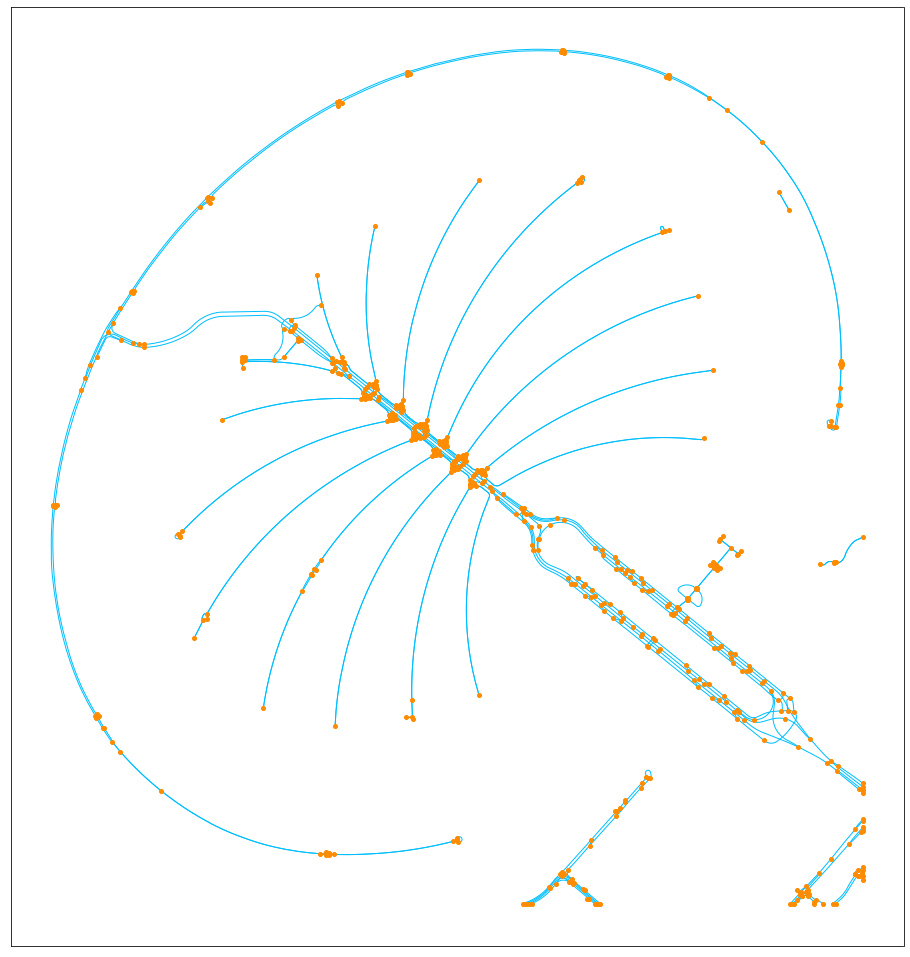

In [ ]:
og.show(network)

## Generate zone grids and zonal geometry information 


**grid2demand_lite** could quickly conduct the geometry analysis and generate the following network files 

1. generate the zones based on the geometry information of nodes

2. generate the straight distance matrix among the created zones 

- python tool: **grid2demand_lite** 
- tool function: 
 - *read_node_csv()* : read 'node.csv'
 - *nodes_to_zone_grids()* : create zones and 'zone.csv'
 - *zone_distance_matrix()*: measure zonal distance and create a distance matrix for trip distribution 
- inputs: 'node.csv'
- outputs: 'zone.csv'

In [ ]:
import grid2demand_lite as gdlite

get 'zone.csv'

In [ ]:
gdlite.read_node_csv()
gdlite.nodes_to_zone_grids()


Latitude used for grid partition =  30

Number of zones including virtual zones = 242


get 'distance_matrix.csv'

In [ ]:
gdlite.zone_distance_matrix()


Latitude used for zone partition=  30

Number of distance pairs between zones=  14641

Largest straight distance = 6.84 km
Average straight distance between zones = 2.75 km


## Trip generation 

**grid2demand_lite** could quickly estimate the trip volume within each zone based on the following information 

1. the amounts of attraction and production for each activity node
2. the number of activity nodes within each zone to aggerate attraction and production for the zone 
3. default external trips of boundary nodes 

*the tool does not require the POI information and 'poi.csv ' (e.g. building area, shopping area, and trip generation rate)*

- python tool: **grid2demand_lite** 

- tool function: 
 - *trip_generation()* : trips calculation (attraction/production)

- inputs: 'zone.csv'
- outputs: 'zone.csv' : update the attraction/production


update 'zone.csv'

In [ ]:
gdlite.trip_generation()

Origin zone with largest production volume is G9
Destination zone with largest attraction volume is G9


## Trip distribution and create zonal demand 

**grid2demand_lite** could quickly estimate demand and supply between each O-D pair through gravity model and trip purpose 


- python tool: **grid2demand_lite** 

- tool function: 
 - *traffic_demand_distributon()* : gravity model for OD demand 

- inputs: 
    - before calling this function, run the prerequisite functions for creating zones, distance measurement, and attraction/production
- outputs: 'demand.csv'

get 'demand.csv'

In [ ]:
gdlite.demand_distributon()

total travel demand: 46018

Top 10 O/D Volume:
Top 1 O/D pair: zone 75 ->zone 110, volume = 1027
Top 2 O/D pair: zone 75 ->zone 47, volume = 813
Top 3 O/D pair: zone 110 ->zone 75, volume = 764
Top 4 O/D pair: zone 47 ->zone 75, volume = 743
Top 5 O/D pair: zone 120 ->zone 75, volume = 727
Top 6 O/D pair: zone 75 ->zone 120, volume = 615
Top 7 O/D pair: zone 120 ->zone 110, volume = 468
Top 8 O/D pair: zone 47 ->zone 110, volume = 461
Top 9 O/D pair: zone 75 ->zone 53, volume = 417
Top 10 O/D pair: zone 75 ->zone 99, volume = 412

        o_zone_id o_zone_name  d_zone_id d_zone_name  accessibility  volume  \
0              1          A1          1          A1       0.000000       0   
1              1          A1          2          A2       0.483415       0   
2              1          A1          3          A3       0.966830       0   
3              1          A1          4          A4       1.450245       0   
4              1          A1          5          A5       1.933660      

,o_zone_id,o_zone_name,d_zone_id,d_zone_name,accessibility,volume,geometry
0,1,A1,1,A1,0.000000,0,"LINESTRING (55.107505 25.142495,55.107505 25.1..."
1,1,A1,2,A2,0.483415,0,"LINESTRING (55.107505 25.142495,55.112515 25.1..."
2,1,A1,3,A3,0.966830,0,"LINESTRING (55.107505 25.142495,55.117525 25.1..."
3,1,A1,4,A4,1.450245,0,"LINESTRING (55.107505 25.142495,55.122535 25.1..."
4,1,A1,5,A5,1.933660,0,"LINESTRING (55.107505 25.142495,55.127545 25.1..."
...,...,...,...,...,...,...,...
14636,121,K11,117,K7,2.055653,0,"LINESTRING (55.157605 25.092395,55.1364369 25...."
14637,121,K11,118,K8,1.664390,0,"LINESTRING (55.157605 25.092395,55.1405241 25...."
14638,121,K11,119,K9,0.966830,0,"LINESTRING (55.157605 25.092395,55.147585 25.0..."
14639,121,K11,120,K10,0.498862,0,"LINESTRING (55.157605 25.092395,55.1530283 25...."


## plot4gmns Tutorial

### Install Package

In [ ]:
pip install plot4gmns

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.7/9.7 MB 56.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 58.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 20.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 63.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.6/96.6 KB 7.6 MB/s eta 0:00:00
  Using cached jedi-0.18.2-py2.py3-none-any.whl (1.6 MB)
  Created wheel for plot4gmns: filename=plot4gmns-0.1.1-py3-none-any.whl size=16049 sha256=df4d5abfd46abcddae29888dbb308a06d5e941d11d25497fa80a54c767626c17
  Stored in directory: /root/.cache/pip/wheels/3d/2d/b3/61462e806cc6f3c5b2536a48ca8fd38934b435fee1cc40f019
  Creat

### import the package

In [ ]:
# Step 1: import required packages
import plot4gmns as p4g

### prepare your absolute directory for the input

In [ ]:
# Step 2: read data from source folder
# source_dir = "/Users/mustafagadah/Dropbox (ASU)/Mac/Downloads/grid2demandlite_dubai 1"
source_dir = "/content/"


### read network from source directory

In [ ]:
mnet=p4g.generate_multi_network_from_csv(source_dir)

Please note, required input files are ['node.csv', 'link.csv', 'poi.csv']
Reading network from CSV files in /content/...
The following file was found in the folder: 
 	 ['node.csv', 'link.csv', 'poi.csv']
The following file was not found in the folder: 
 	 ['demand.csv', 'zone.csv']
Complete file loading
Test path:  /content//node.csv
User Guide: https://docs.kepler.gl/docs/keplergl-jupyter
Map saved to /content/p4g_fig_results/plot4gmns_vis_map.html!


Successfully save figure to /content/p4g_fig_results/network_by_mode.png


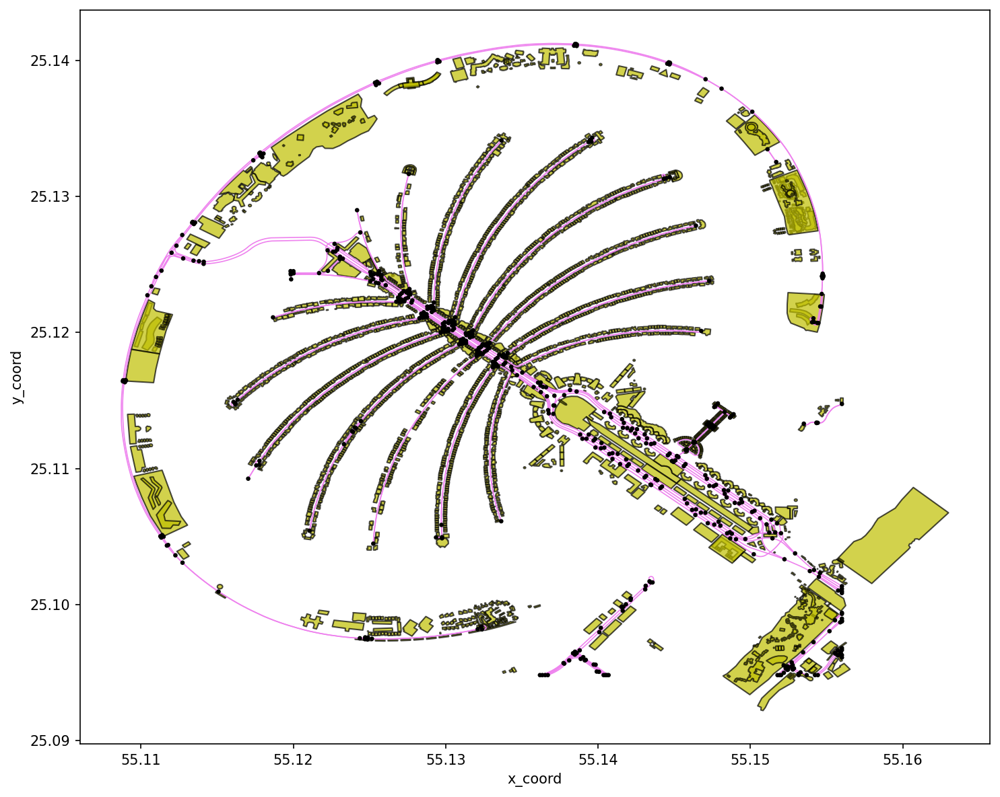

In [ ]:
# Step 3: generate read data and generate visualization
# draw 'all' modes network and save to png file
cf = p4g.show_network_by_modes(mnet=mnet)
# show the figure on the current window
cf.show()

Successfully save figure to /content/p4g_fig_results/network_by_mode_1.png


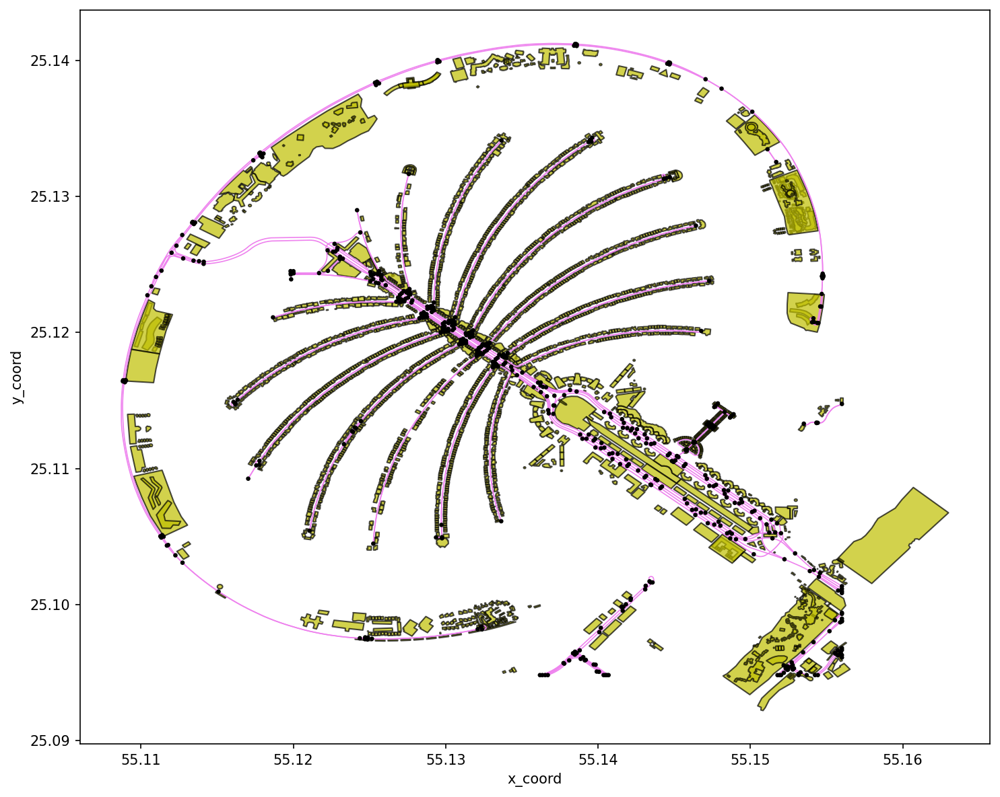

In [ ]:
# show 'auto' mode network 
# can not show bike modes since the selected region have no bike links
cf = p4g.show_network_by_modes(mnet=mnet, modes=['auto'])
cf.show()  # show the figure on the current window


Successfully save figure to /content/p4g_fig_results/network_by_node_type.png


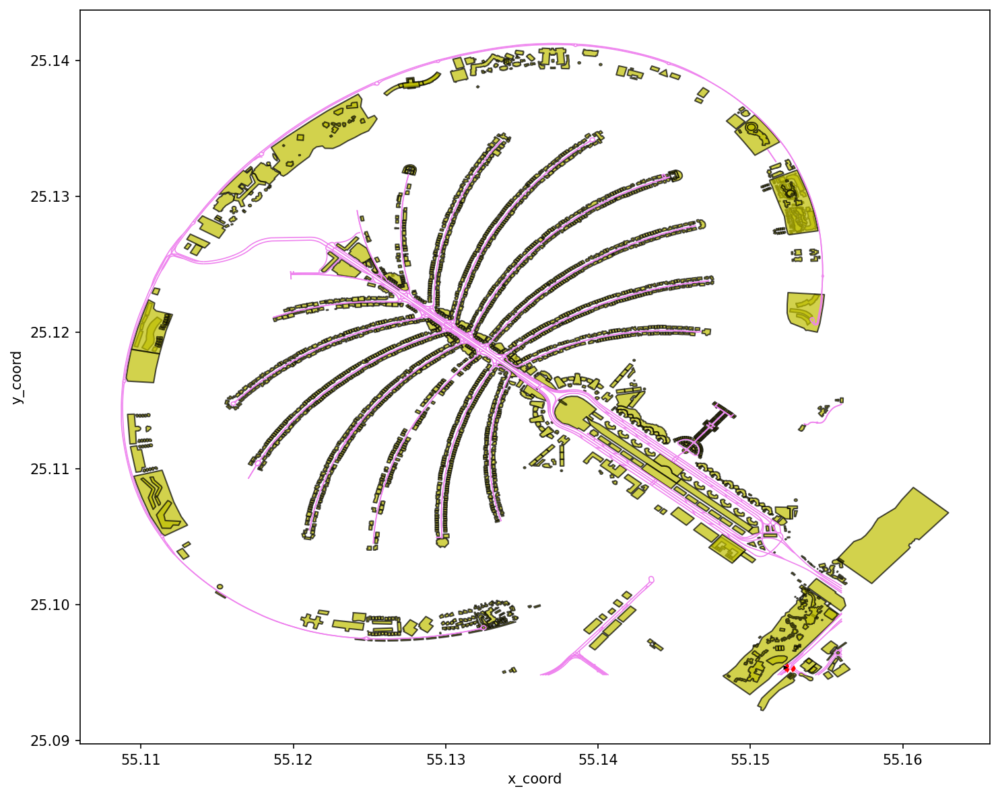

In [ ]:
cf = p4g.show_network_by_node_types(
    mnet=mnet, osm_highway=['traffic_signals', 'crossing'])
cf.show()


Successfully save figure to /content/p4g_fig_results/network_by_link_type.png


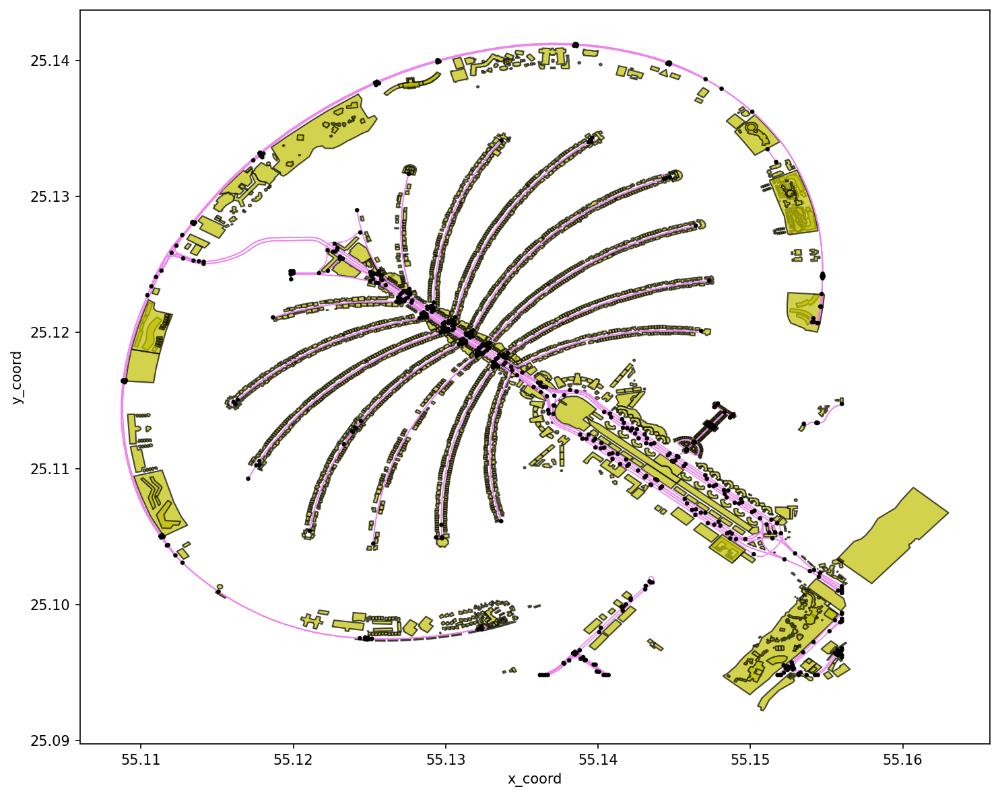

In [ ]:
# show network by given link types
cf = p4g.show_network_by_link_types(
    mnet=mnet, link_types=['secondary', 'footway'])
cf.show()


Successfully save figure to /content/p4g_fig_results/network_by_link_length.png


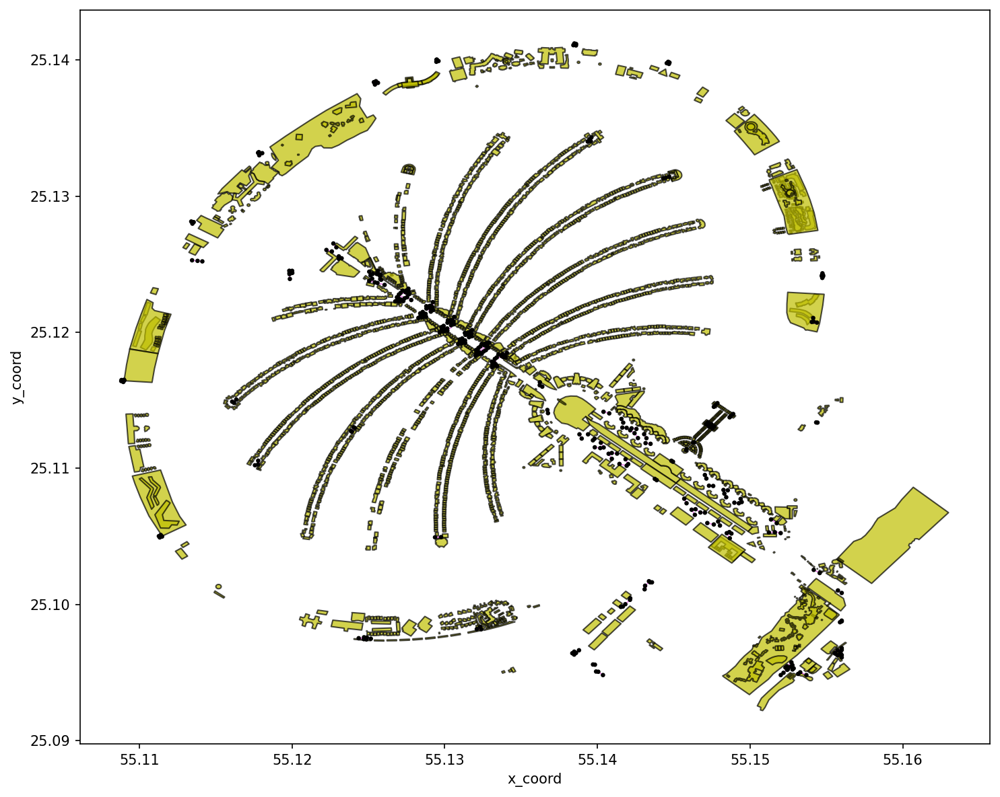

In [ ]:
# show network by given link length range
cf = p4g.show_network_by_link_length(mnet=mnet, min_length=10, max_length=50)
cf.show()


Successfully save figure to /content/p4g_fig_results/network_by_link_lane.png


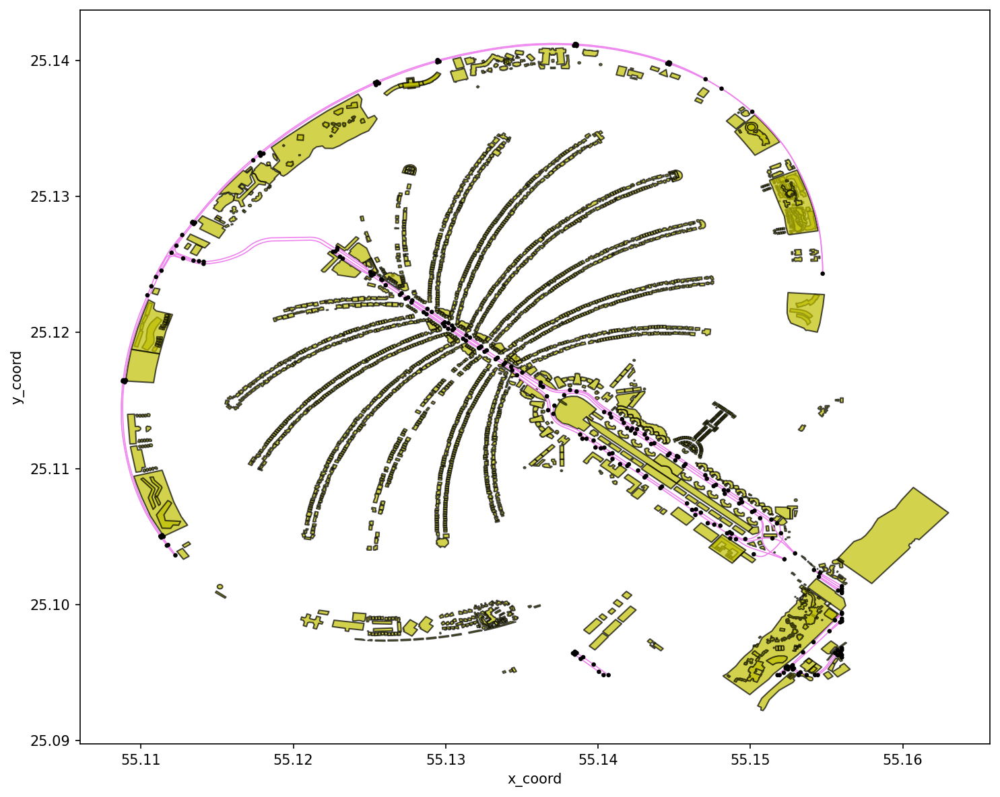

In [ ]:
# show network by given link lane range
cf = p4g.show_network_by_link_lanes(mnet=mnet, min_lanes=1, max_lanes=3)
cf.show()


Successfully save figure to /content/p4g_fig_results/network_by_link_free_speed.png


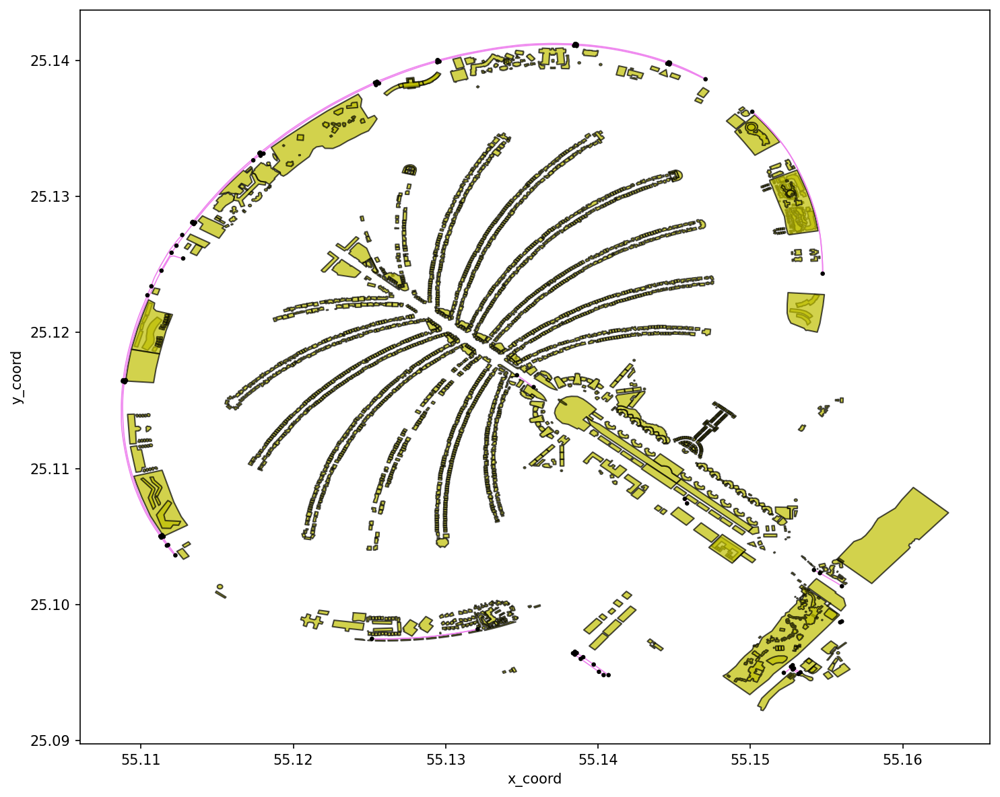

In [ ]:
# show network by given link free speed range
cf = p4g.show_network_by_link_free_speed(
    mnet=mnet, min_free_speed=10, max_free_speed=40)
cf.show()


Successfully save figure to /content/p4g_fig_results/network_by_poi_type_1.png


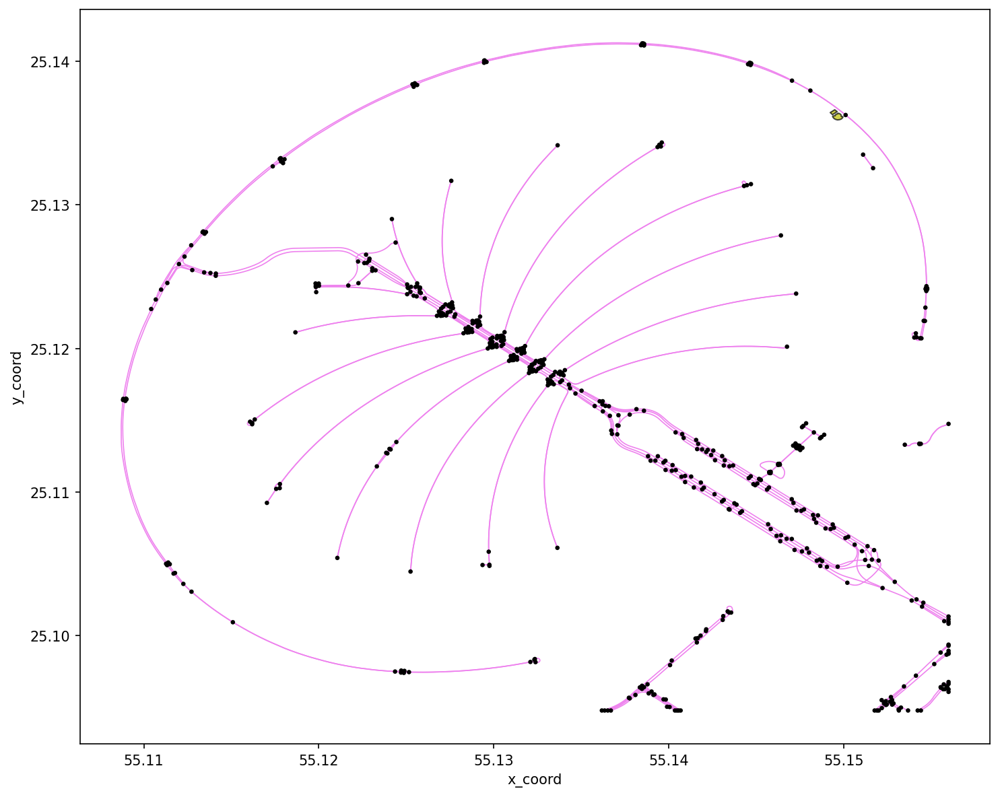

In [ ]:
cf = p4g.show_network_by_poi_types(
    mnet=mnet, poi_type=['public', 'industrial'])
cf.show()


In [ ]:
cf = p4g.show_network_demand_matrix_heatmap(mnet)
cf.show()


AttributeError: ignored

Successfully save figure to c:/Users/roche/Downloads/grid2demandlite_dubai/p4g_fig_results/network_by_demand_od.png


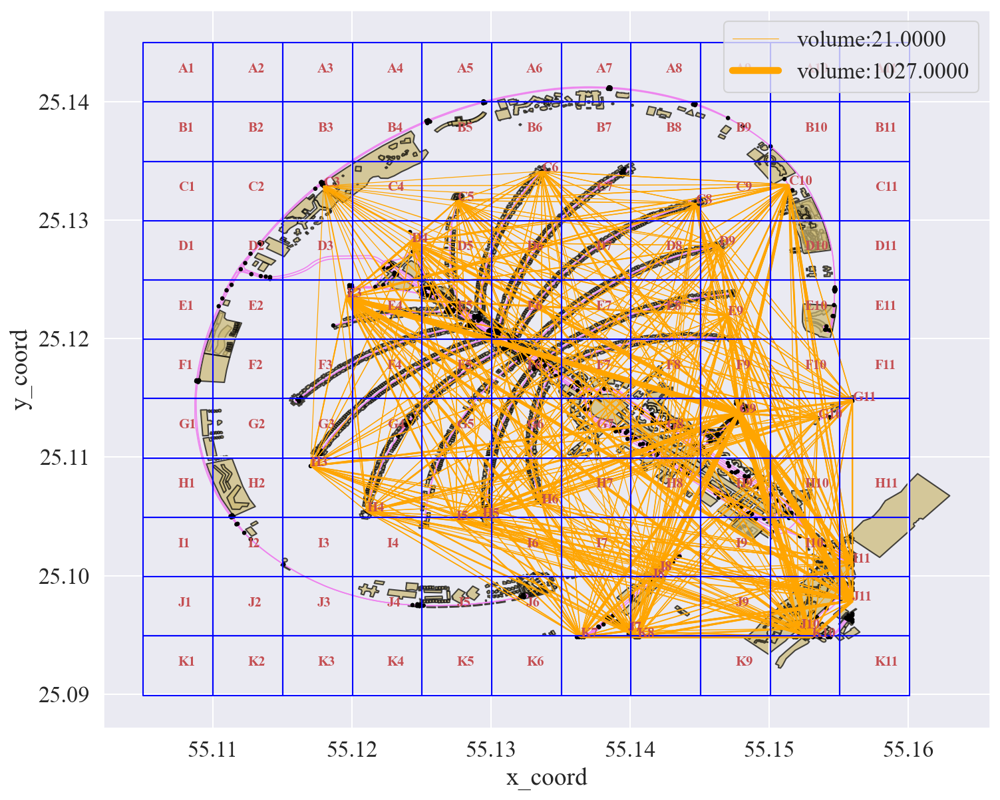

In [ ]:
cf = p4g.show_network_by_demand_OD(mnet=mnet, load_network=True)
cf.show()


Successfully save figure to c:/Users/roche/Downloads/grid2demandlite_dubai/p4g_fig_results/network_by_mode_1_1_1.png


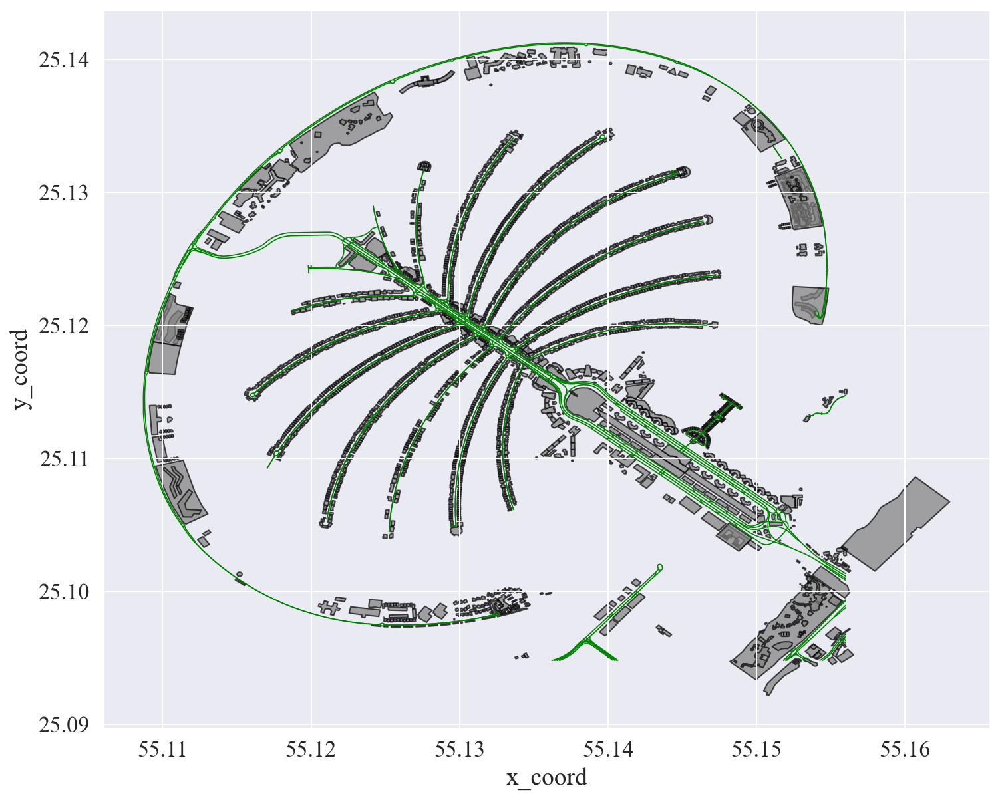

In [ ]:
mnet.style.node_style.size = 3
mnet.style.link_style.linecolor = 'green'
mnet.style.poi_style.facecolor = 'gray'
cf = p4g.show_network_by_modes(mnet=mnet)
cf.show()
